Cargo librerias

In [62]:
import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
from datetime import timedelta

Creo los dataframe a apertir de archivos de excel

In [63]:
df_train = pd.read_excel('./bike_train.xlsx')
df_train.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [64]:
df_test = pd.read_excel('./bike_test.xlsx')
df_test.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed
0,12000,2012-05-20,2,1,5,4,0,0,0,1,0.52,0.5000,0.68,0.0896
1,12001,2012-05-20,2,1,5,5,0,0,0,1,0.50,0.4848,0.72,0.1045
2,12002,2012-05-20,2,1,5,6,0,0,0,1,0.50,0.4848,0.63,0.1343
3,12003,2012-05-20,2,1,5,7,0,0,0,1,0.52,0.5000,0.68,0.1940
4,12004,2012-05-20,2,1,5,8,0,0,0,1,0.56,0.5303,0.56,0.1642


# EDA

Tabajaremos con series de tiempo, por lo cual todo el analisis va a realizar en este enfoque.

Exploracion de  los Dataframe

Dataframe Train

In [65]:
df_train.shape

(11999, 17)

In [66]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11999 entries, 0 to 11998
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   instant     11999 non-null  int64         
 1   dteday      11999 non-null  datetime64[ns]
 2   season      11999 non-null  int64         
 3   yr          11999 non-null  int64         
 4   mnth        11999 non-null  int64         
 5   hr          11999 non-null  int64         
 6   holiday     11999 non-null  int64         
 7   weekday     11999 non-null  int64         
 8   workingday  11999 non-null  int64         
 9   weathersit  11999 non-null  int64         
 10  temp        11999 non-null  float64       
 11  atemp       11999 non-null  float64       
 12  hum         11999 non-null  float64       
 13  windspeed   11999 non-null  float64       
 14  casual      11999 non-null  int64         
 15  registered  11999 non-null  int64         
 16  cnt         11999 non-

In [67]:
print('fecha_inicio', df_train.dteday.min())
print('fecha_fin', df_train.dteday.max())
print(df_train.dteday.max() - df_train.dteday.min())

fecha_inicio 2011-01-01 00:00:00
fecha_fin 2012-05-20 00:00:00
505 days 00:00:00


- Tenemos una `frecuencia de muestreo horaria` y una `ventana temporal` de 505 días. Lo más probable es que sea necesario resamplear la muestra. 

In [68]:
df_train.describe()

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
count,11999.000000,11999.000000,11999.000000,11999.000000,11999.000000,11999.000000,11999.000000,11999.000000,11999.000000,11999.000000,11999.000000,11999.000000,11999.000000,11999.000000,11999.000000,11999.000000
mean,6000.000000,2.210684,0.279523,5.530294,11.556630,0.027752,3.009334,0.684057,1.435036,0.465704,0.448888,0.625770,0.196433,30.049837,128.545129,158.594966
std,3463.957275,1.088798,0.448784,3.433005,6.911891,0.164269,2.005264,0.464910,0.650894,0.188576,0.169633,0.200637,0.125394,43.596915,124.692750,151.392952
min,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,3000.500000,1.000000,0.000000,3.000000,6.000000,0.000000,1.000000,0.000000,1.000000,0.320000,0.303000,0.470000,0.104500,3.000000,29.000000,34.000000
50%,6000.000000,2.000000,0.000000,5.000000,12.000000,0.000000,3.000000,1.000000,1.000000,0.460000,0.454500,0.620000,0.194000,13.000000,98.000000,118.000000
75%,8999.500000,3.000000,1.000000,8.000000,18.000000,0.000000,5.000000,1.000000,2.000000,0.620000,0.590900,0.790000,0.283600,39.000000,185.000000,232.000000
max,11999.000000,4.000000,1.000000,12.000000,23.000000,1.000000,6.000000,1.000000,4.000000,0.960000,1.000000,1.000000,0.850700,367.000000,770.000000,957.000000


Dataframe TEST

In [69]:
df_test.shape

(5380, 14)

In [70]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5380 entries, 0 to 5379
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   instant     5380 non-null   int64         
 1   dteday      5380 non-null   datetime64[ns]
 2   season      5380 non-null   int64         
 3   yr          5380 non-null   int64         
 4   mnth        5380 non-null   int64         
 5   hr          5380 non-null   int64         
 6   holiday     5380 non-null   int64         
 7   weekday     5380 non-null   int64         
 8   workingday  5380 non-null   int64         
 9   weathersit  5380 non-null   int64         
 10  temp        5380 non-null   float64       
 11  atemp       5380 non-null   float64       
 12  hum         5380 non-null   float64       
 13  windspeed   5380 non-null   float64       
dtypes: datetime64[ns](1), float64(4), int64(9)
memory usage: 588.6 KB


In [71]:
df_test.describe()

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed
count,5380.000000,5380.000000,5380.0,5380.000000,5380.000000,5380.000000,5380.000000,5380.00000,5380.000000,5380.000000,5380.000000,5380.000000,5380.000000
mean,14689.500000,3.150558,1.0,8.784758,11.524721,0.031041,2.991078,0.67974,1.403532,0.566758,0.535741,0.630483,0.175968
std,1553.216555,0.839184,0.0,2.145166,6.920601,0.173444,2.007032,0.46662,0.612343,0.182800,0.161300,0.174493,0.113988
min,12000.000000,1.000000,1.0,5.000000,0.000000,0.000000,0.000000,0.00000,1.000000,0.140000,0.151500,0.160000,0.000000
25%,13344.750000,3.000000,1.0,7.000000,6.000000,0.000000,1.000000,0.00000,1.000000,0.400000,0.409100,0.490000,0.104500
50%,14689.500000,3.000000,1.0,9.000000,12.000000,0.000000,3.000000,1.00000,1.000000,0.600000,0.575800,0.640000,0.164200
75%,16034.250000,4.000000,1.0,11.000000,18.000000,0.000000,5.000000,1.00000,2.000000,0.700000,0.666700,0.780000,0.253700
max,17379.000000,4.000000,1.0,12.000000,23.000000,1.000000,6.000000,1.00000,3.000000,1.000000,0.924200,1.000000,0.656700


Cambio tipos de datos

Graficamos y Analizamos datos:

Temas a analizar:
  Correlacion de rentadas con:

                                - cada variable

                                - grupo de variables

                                - día de la semana

                                - clima
                                
                                - Epoca del año
                               


Convertimos Fecha a Fecha y hora

In [72]:
df_train['fecha'] = df_train['dteday'].dt.strftime('%Y-%m-%d')
df_train['hr_str'] = df_train['hr'].astype('str') 
df_train['dteday'] = df_train['fecha'] + ' ' +df_train['hr_str']+':00:00'
df_train['dteday'] = pd.to_datetime(df_train['dteday'])
df_train.drop(columns= ['fecha','hr_str'], inplace= True)
df_train = df_train.set_index('dteday')
df_train = df_train.sort_index() 

In [73]:
df_test['fecha'] = df_test['dteday'].dt.strftime('%Y-%m-%d')
df_test['hr_str'] = df_test['hr'].astype('str') 
df_test['dteday'] = df_test['fecha'] + ' ' +df_test['hr_str']+':00:00'
df_test['dteday'] = pd.to_datetime(df_test['dteday'])
df_test.drop(columns= ['fecha','hr_str'], inplace= True)
df_test = df_test.set_index('dteday')
df_test = df_test.sort_index() 

In [74]:
#fig, ax = plt.subplots(figsize = (30, 10))
#sns.lineplot(x= df_train['dteday'], y= df_train['cnt'])

fig = px.line(df_train, x= df_train.index, y= df_train.cnt)
fig.update_layout(title ='Linea de tiempo horaria de Alquiler'
            )
fig.update_xaxes(title_text='Fecha')
fig.update_yaxes(title_text= 'Renta')

In [75]:
fig = px.line(df_train, x= df_train.iloc[6000:6750].index, y= df_train.iloc[6000:6750].cnt)
fig.update_layout(title ='Muestra de Alquiler 30 dias',  
                           )
fig.update_xaxes(title_text='Fecha')
fig.update_yaxes(title_text= 'Renta')

Realizamos resample para visualizar mejor y reducir ruidos

In [76]:
df_train.reset_index(inplace= True)

In [77]:
df_train_resample_D = df_train.resample('D', on = 'dteday').mean()

In [78]:
df_train_resample_D.head()

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
dteday,,,,,,,,,,,,,,,,
2011-01-01,12.5,1.0,0.0,1.0,11.500000,0.0,6.0,0.0,1.583333,0.344167,0.363625,0.805833,0.160446,13.791667,27.250000,41.041667
2011-01-02,36.0,1.0,0.0,1.0,11.782609,0.0,0.0,0.0,1.956522,0.363478,0.353739,0.696087,0.248539,5.695652,29.130435,34.826087
2011-01-03,58.5,1.0,0.0,1.0,12.318182,0.0,1.0,1.0,1.000000,0.196364,0.189405,0.437273,0.248309,5.454545,55.863636,61.318182
2011-01-04,81.0,1.0,0.0,1.0,11.869565,0.0,2.0,1.0,1.043478,0.200000,0.212122,0.590435,0.160296,4.695652,63.217391,67.913043
2011-01-05,104.0,1.0,0.0,1.0,11.869565,0.0,3.0,1.0,1.000000,0.226957,0.229270,0.436957,0.186900,3.565217,66.000000,69.565217


In [79]:
fig = px.line(df_train_resample_D, x= df_train_resample_D.index, y= df_train_resample_D.cnt)
fig.update_layout(title ='Resample Diario',  
                           )
fig.update_xaxes(title_text='Fecha')
fig.update_yaxes(title_text= 'Renta')

Resample semanal

In [80]:
df_train_resample_W = df_train.resample('W', on = 'dteday').mean()

In [81]:
df_train_resample_W.head()

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
dteday,,,,,,,,,,,,,,,,
2011-01-02,24.0,1.0,0.0,1.0,11.638298,0.000000,3.063830,0.000000,1.765957,0.353617,0.358787,0.752128,0.203555,9.829787,28.170213,38.000000
2011-01-09,128.5,1.0,0.0,1.0,11.820988,0.000000,3.012346,0.703704,1.259259,0.189136,0.192397,0.493333,0.212834,4.123457,53.950617,58.074074
2011-01-16,291.0,1.0,0.0,1.0,11.742331,0.000000,3.000000,0.705521,1.349693,0.183804,0.189537,0.534479,0.203652,4.134969,51.233129,55.368098
2011-01-23,449.0,1.0,0.0,1.0,12.117647,0.156863,3.078431,0.542484,1.555556,0.180784,0.182322,0.545294,0.222324,3.954248,53.366013,57.320261
2011-01-30,595.0,1.0,0.0,1.0,11.956835,0.000000,2.892086,0.669065,1.625899,0.191367,0.207873,0.680863,0.144749,4.474820,50.913669,55.388489


In [82]:
fig = px.line(df_train_resample_W, x= df_train_resample_W.index, y= df_train_resample_W.cnt)
fig.update_layout(title ='Resample Semanal',  
                           )
fig.update_xaxes(title_text='Fecha')
fig.update_yaxes(title_text= 'Renta')

Se observa una alta mejora en la reducción de ruido. Deberemos ver cuanto afecta a la precisión de la predicción

#### Componentes de la serie de tiempo

- Media Móvil

Trabajaremos con todas las muestras

In [83]:
# cantidad de muestras
df_train_copia = df_train.copy()
len(df_train_copia)

11999

In [84]:
ventana_media_movil = (660)

In [85]:
semanal_promedio_tendencia = df_train_copia.cnt.rolling(window=ventana_media_movil, center = True).mean()
semanal_promedio_tendencia

0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
         ..
11994   NaN
11995   NaN
11996   NaN
11997   NaN
11998   NaN
Name: cnt, Length: 11999, dtype: float64

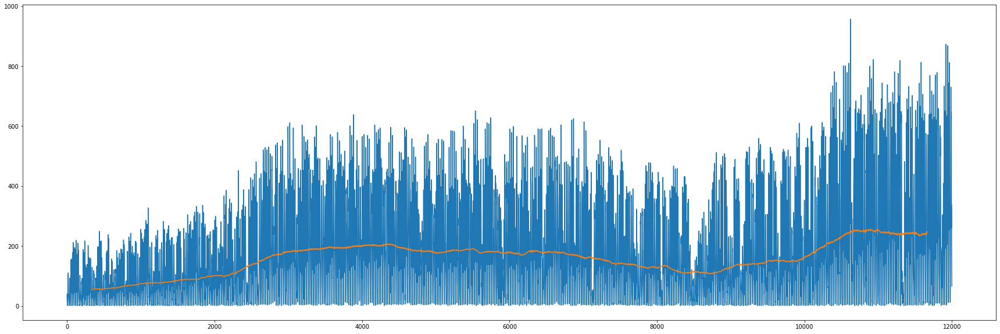

In [86]:
fig, ax = plt.subplots(figsize = (30, 10))
plt.plot(df_train_copia.index, df_train_copia.cnt)
plt.plot(semanal_promedio_tendencia)

- Estacionalidad

In [87]:
df_train_index = df_train_copia.set_index('dteday')

Text(0, 0.5, 'Rentas')

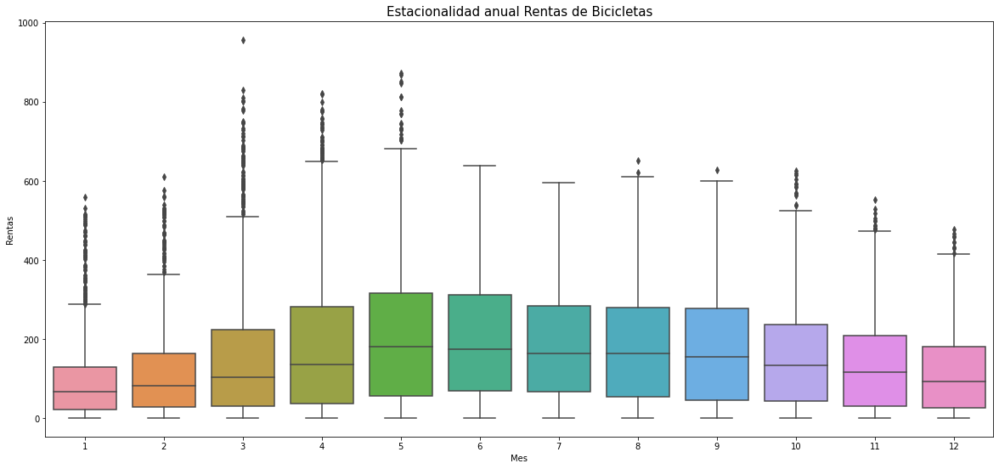

In [88]:
plt.figure(figsize = (20,9))
sns.boxplot(data=df_train_index,x=df_train_index.index.month,y= df_train_index.cnt)
plt.title('Estacionalidad anual Rentas de Bicicletas', fontsize = 15)
plt.xlabel('Mes')
plt.ylabel('Rentas')

- Otros analisis

In [89]:
# Correlación
# columnas season	yr	mnth	hr	holiday	weekday	workingday	weathersit	temp	atemp	hum	windspeed	casual	registered	cnt
df_corr = df_train_copia[['yr',	'hr', 'mnth', 'season', 'holiday', 'weekday', 'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed', 'casual', 'registered',  'cnt']].corr()

In [90]:
df_corr

,yr,hr,mnth,season,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
yr,1.000000,-0.003948,-0.488103,-0.446665,0.001039,-0.002714,0.001068,-0.006309,-0.198929,-0.190360,-0.141319,0.067356,0.053371,0.171910,0.156960
hr,-0.003948,1.000000,-0.007060,-0.007610,0.000414,-0.004037,0.003454,-0.024003,0.139251,0.134633,-0.257202,0.130441,0.285182,0.381933,0.396698
mnth,-0.488103,-0.007060,1.000000,0.865268,0.009372,0.014500,0.006441,-0.012239,0.353330,0.358541,0.201669,-0.147042,0.078563,0.061686,0.073431
season,-0.446665,-0.007610,0.865268,1.000000,-0.008928,-0.003688,0.012630,-0.009029,0.410790,0.413196,0.198937,-0.142924,0.119043,0.093595,0.111369
holiday,0.001039,0.000414,0.009372,-0.008928,1.000000,-0.102503,-0.248601,-0.014707,-0.028519,-0.038005,-0.036672,0.022681,0.022140,-0.044534,-0.030304
weekday,-0.002714,-0.004037,0.014500,-0.003688,-0.102503,1.000000,0.031057,0.017259,-0.010002,-0.009841,-0.025932,0.008447,0.023687,0.019179,0.022618
workingday,0.001068,0.003454,0.006441,0.012630,-0.248601,0.031057,1.000000,0.042202,0.062273,0.066305,0.022805,-0.002493,-0.298241,0.134789,0.025132
weathersit,-0.006309,-0.024003,-0.012239,-0.009029,-0.014707,0.017259,0.042202,1.000000,-0.080149,-0.081386,0.430378,0.009195,-0.147903,-0.130223,-0.149848
temp,-0.198929,0.139251,0.353330,0.410790,-0.028519,-0.010002,0.062273,-0.080149,1.000000,0.991785,-0.019289,-0.013984,0.450777,0.322875,0.395743
atemp,-0.190360,0.134633,0.358541,0.413196,-0.038005,-0.009841,0.066305,-0.081386,0.991785,1.000000,-0.003669,-0.057619,0.447899,0.323264,0.395234


C:\Users\Mauricio\AppData\Local\Temp\ipykernel_14572\675664977.py:2: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



<AxesSubplot:>

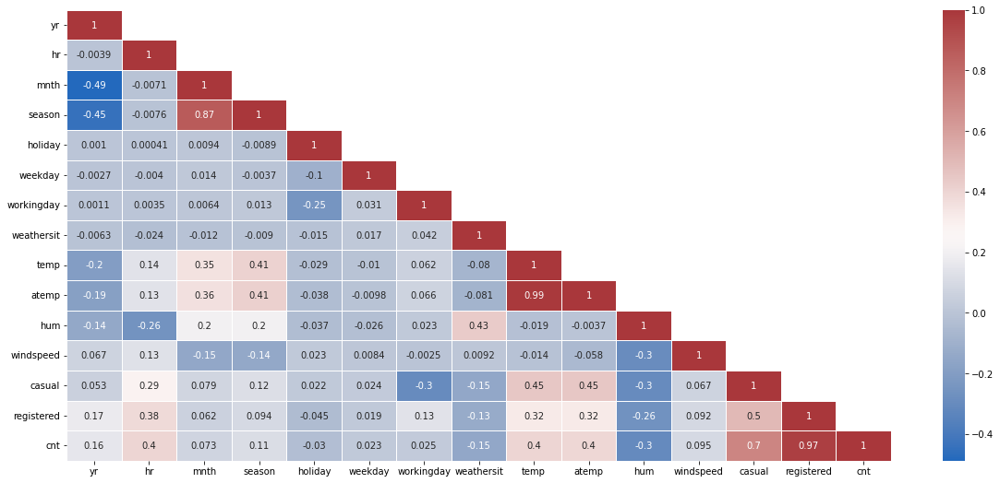

In [91]:
# Quitamos el triangulo superior para facilitar la lectura
bool_upper_matrix = np.tril(np.ones(df_corr.shape)).astype(np.bool)
df_corr = df_corr.where(bool_upper_matrix)

plt.figure(figsize = (20,9))
sns.heatmap(df_corr, linecolor= 'white', linewidths= 1, annot= True, cmap= "vlag")

In [92]:
df_corr.loc['cnt'].sort_values()

hum          -0.303672
weathersit   -0.149848
holiday      -0.030304
weekday       0.022618
workingday    0.025132
mnth          0.073431
windspeed     0.094791
season        0.111369
yr            0.156960
atemp         0.395234
temp          0.395743
hr            0.396698
casual        0.702414
registered    0.968540
cnt           1.000000
Name: cnt, dtype: float64

Mayores correlaciones:

- registered 0.95
- casual 0.70
- hr 0.39
- atemp 0.39
- temp 0.39
- hum -0.30

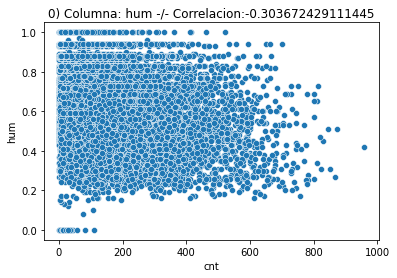

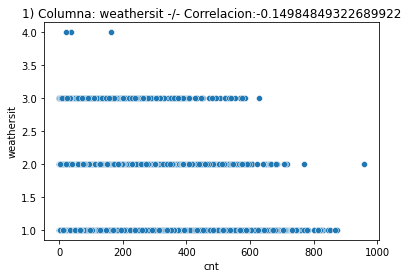

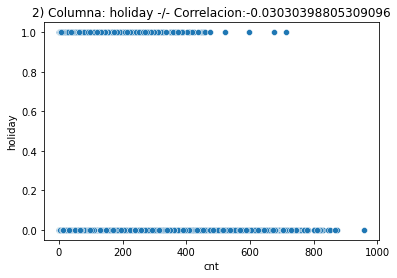

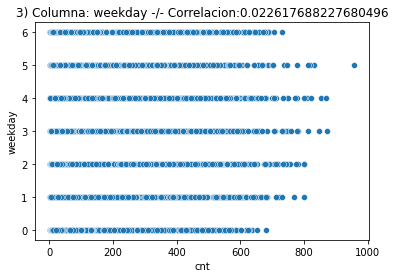

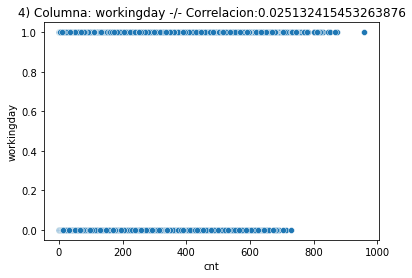

...

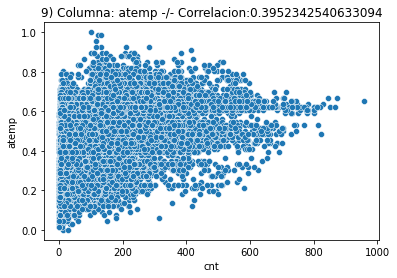

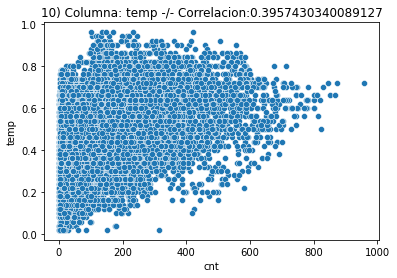

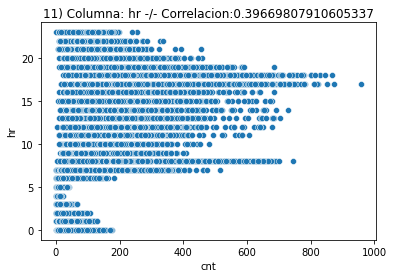

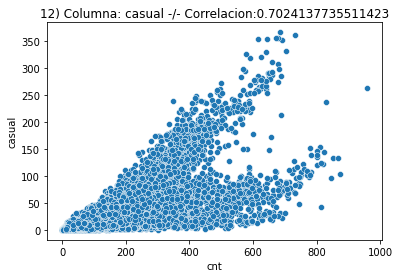

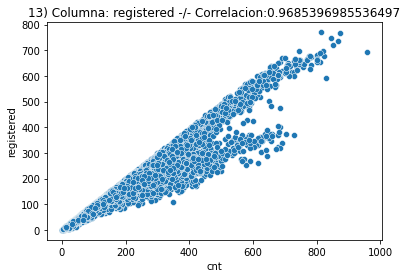

In [93]:
cols = df_corr.loc['cnt'].sort_values(ascending=True).index
vals = df_corr.loc['cnt'].sort_values(ascending=True).values

tam = len(vals)
i = 0
while i < tam:
    if not (vals[i] is None) and (cols[i] != 'cnt'):
        ax = plt.axes()
        sns.scatterplot(x="cnt", y=cols[i], data=df_train_copia[['cnt',cols[i]]])
        titulo = str(i) + ") Columna: " + str(cols[i]) + " -/- Correlacion:" + str(vals[i])
        ax.set_title(titulo)
        plt.show()
    i+=1

Text(0.5, 1.0, 'Dia Laboral')

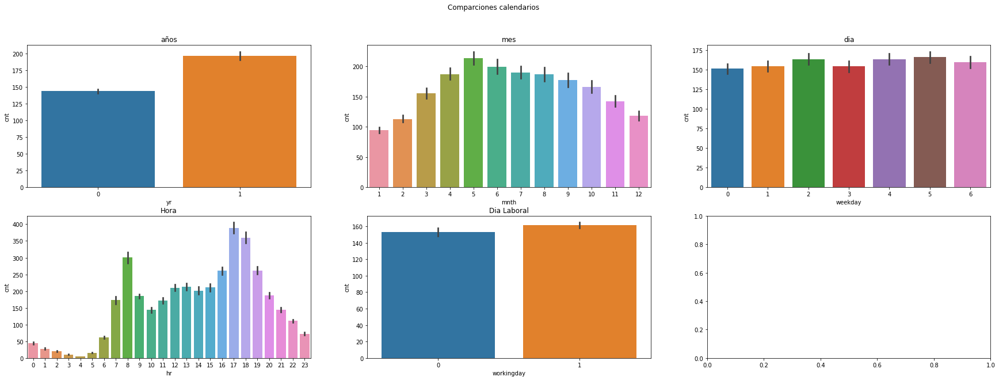

In [94]:
fig, axes = plt.subplots(2, 3, figsize=(30, 10), sharey=False)
fig.suptitle('Comparciones calendarios')

# Año
sns.barplot(ax=axes[0,0], x=df_train_copia['yr'], y=df_train_copia['cnt'])
axes[0,0].set_title('años')

# Mes
sns.barplot(ax=axes[0,1], x=df_train_copia['mnth'], y=df_train_copia['cnt'])
axes[0,1].set_title('mes')

# Dia
sns.barplot(ax=axes[0,2], x=df_train_copia['weekday'], y=df_train_copia['cnt'])
axes[0,2].set_title('dia')

# Hora 
sns.barplot(ax=axes[1,0], x=df_train_copia['hr'], y=df_train_copia['cnt'])
axes[1,0].set_title('Hora')

# Hora 
sns.barplot(ax=axes[1,1], x=df_train_copia['workingday'], y=df_train_copia['cnt'])
axes[1,1].set_title('Dia Laboral')


Text(0.5, 1.0, 'Velocidad viento')

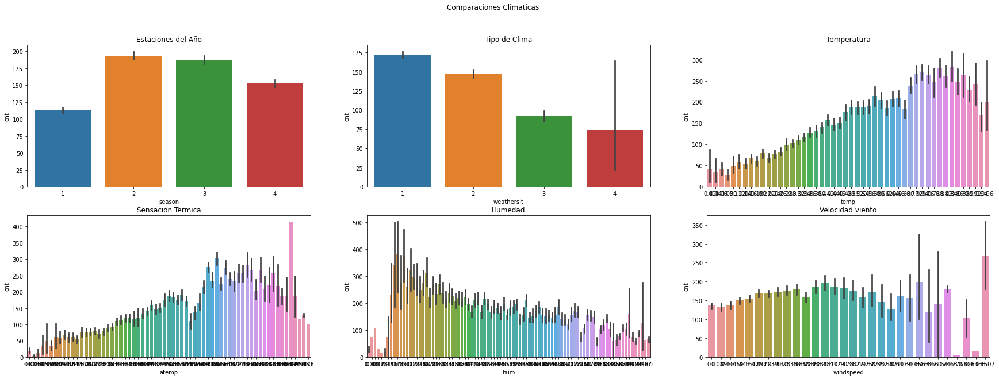

In [95]:
fig, axes = plt.subplots(2, 3, figsize=(30, 10), sharey=False)
fig.suptitle('Comparaciones Climaticas')

# Estacion del año
sns.barplot(ax=axes[0,0], x=df_train_copia['season'], y=df_train_copia['cnt'])
axes[0,0].set_title('Estaciones del Año')

# Tipo de clima
sns.barplot(ax=axes[0,1], x=df_train_copia['weathersit'], y=df_train_copia['cnt'])
axes[0,1].set_title('Tipo de Clima')

# Temperatura
sns.barplot(ax=axes[0,2], x=df_train_copia['temp'], y=df_train_copia['cnt'])
axes[0,2].set_title('Temperatura')

# Sensacion Termica
sns.barplot(ax=axes[1,0], x=df_train_copia['atemp'], y=df_train_copia['cnt'])
axes[1,0].set_title('Sensacion Termica')

# Humedad
sns.barplot(ax=axes[1,1], x=df_train_copia['hum'], y=df_train_copia['cnt'])
axes[1,1].set_title('Humedad')

# Velocidad viento
sns.barplot(ax=axes[1,2], x=df_train_copia['windspeed'], y=df_train_copia['cnt'])
axes[1,2].set_title('Velocidad viento')


# Modelo Predictivo (Series temporales)
### Forecasting con Prophet


Primera etapa. Ejecutamos el modelo solo con columna fecha y renta(cnt)

In [96]:
df_train_copia.head()

,dteday,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,2011-01-01 00:00:00,1,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2011-01-01 01:00:00,2,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,2011-01-01 02:00:00,3,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,2011-01-01 03:00:00,4,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,2011-01-01 04:00:00,5,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [97]:
df = df_train_copia[['dteday', 'cnt']]
df = df.rename(columns= {'dteday' : 'ds', 'cnt' : 'y'})
df.head()


,ds,y
0,2011-01-01 00:00:00,16
1,2011-01-01 01:00:00,40
2,2011-01-01 02:00:00,32
3,2011-01-01 03:00:00,13
4,2011-01-01 04:00:00,1


In [98]:
from prophet import Prophet

In [99]:
modelo = Prophet(daily_seasonality= True, weekly_seasonality= True, changepoint_prior_scale= 0.5, seasonality_prior_scale= 5)
modelo.fit(df)

09:03:25 - cmdstanpy - INFO - Chain [1] start processing
09:03:30 - cmdstanpy - INFO - Chain [1] done processing


Determinamos datos test

In [100]:
df_test.reset_index(inplace= True)
df_test_copia = df_test[['dteday']]
df_test_copia = df_test_copia.rename(columns= {'dteday' : 'ds'})

df_test_copia.head()

,ds
0,2012-05-20 04:00:00
1,2012-05-20 05:00:00
2,2012-05-20 06:00:00
3,2012-05-20 07:00:00
4,2012-05-20 08:00:00


In [101]:
future = modelo.make_future_dataframe(periods=len(df_test_copia), freq= 'H')

In [102]:
future

,ds
0,2011-01-01 00:00:00
1,2011-01-01 01:00:00
2,2011-01-01 02:00:00
3,2011-01-01 03:00:00
4,2011-01-01 04:00:00
...,...
17374,2012-12-30 03:00:00
17375,2012-12-30 04:00:00
17376,2012-12-30 05:00:00
17377,2012-12-30 06:00:00


In [103]:
forecast = modelo.predict(future)
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2011-01-01 00:00:00,45.214231,-161.464689,74.807611,45.214231,45.214231,-88.279366,-88.279366,-88.279366,-92.274419,-92.274419,-92.274419,3.995052,3.995052,3.995052,0.0,0.0,0.0,-43.065136
1,2011-01-01 01:00:00,45.228493,-190.530456,63.783392,45.228493,45.228493,-102.754302,-102.754302,-102.754302,-106.560082,-106.560082,-106.560082,3.805780,3.805780,3.805780,0.0,0.0,0.0,-57.525809
2,2011-01-01 02:00:00,45.242755,-216.676608,31.263627,45.242755,45.242755,-138.764625,-138.764625,-138.764625,-142.403295,-142.403295,-142.403295,3.638670,3.638670,3.638670,0.0,0.0,0.0,-93.521869
3,2011-01-01 03:00:00,45.257018,-246.016272,-4.219848,45.257018,45.257018,-173.307028,-173.307028,-173.307028,-176.800695,-176.800695,-176.800695,3.493667,3.493667,3.493667,0.0,0.0,0.0,-128.050010
4,2011-01-01 04:00:00,45.271280,-252.785489,-11.436439,45.271280,45.271280,-173.027768,-173.027768,-173.027768,-176.397983,-176.397983,-176.397983,3.370215,3.370215,3.370215,0.0,0.0,0.0,-127.756488


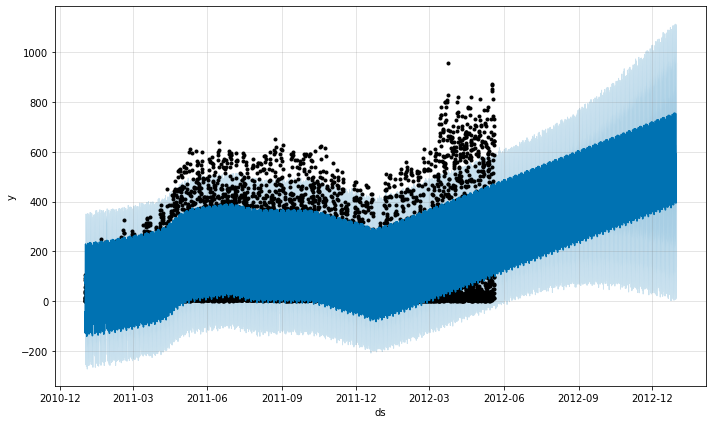

In [104]:
fig1 = modelo.plot(forecast)

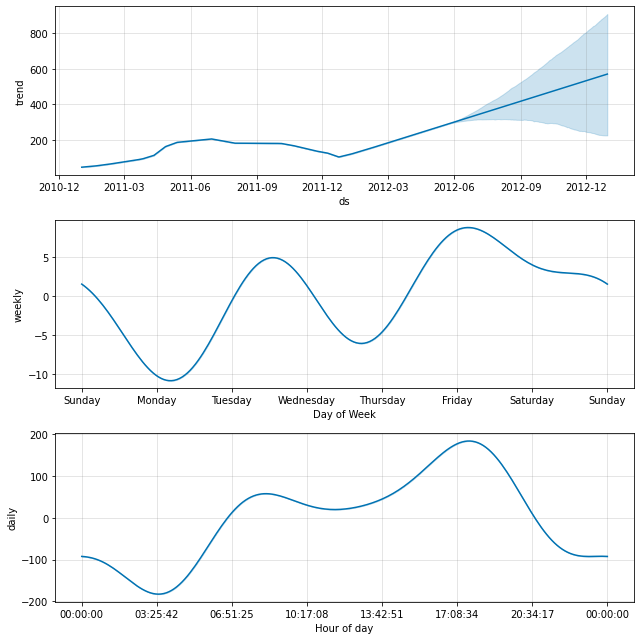

In [105]:
fig2 = modelo.plot_components(forecast)

### Evaluamos el Modelo de una variable

In [106]:
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric
from prophet.plot import plot_plotly, plot_forecast_component_plotly

In [107]:
df_cv = cross_validation(modelo, horizon = '30 days')

  0%|          | 0/26 [00:00<?, ?it/s]09:03:37 - cmdstanpy - INFO - Chain [1] start processing
09:03:38 - cmdstanpy - INFO - Chain [1] done processing
  4%|▍         | 1/26 [00:01<00:31,  1.27s/it]09:03:39 - cmdstanpy - INFO - Chain [1] start processing
09:03:39 - cmdstanpy - INFO - Chain [1] done processing
  8%|▊         | 2/26 [00:02<00:25,  1.08s/it]09:03:40 - cmdstanpy - INFO - Chain [1] start processing
09:03:40 - cmdstanpy - INFO - Chain [1] done processing
 12%|█▏        | 3/26 [00:03<00:23,  1.02s/it]09:03:41 - cmdstanpy - INFO - Chain [1] start processing
09:03:41 - cmdstanpy - INFO - Chain [1] done processing
 15%|█▌        | 4/26 [00:04<00:24,  1.11s/it]09:03:42 - cmdstanpy - INFO - Chain [1] start processing
09:03:42 - cmdstanpy - INFO - Chain [1] done processing
 19%|█▉        | 5/26 [00:05<00:23,  1.13s/it]09:03:43 - cmdstanpy - INFO - Chain [1] start processing
09:03:44 - cmdstanpy - INFO - Chain [1] done processing
 23%|██▎       | 6/26 [00:06<00:23,  1.19s/it]09:03:44

In [108]:
df_cv.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2011-04-11 04:00:00,14.681264,-42.318673,76.021093,1,2011-04-11 03:00:00
1,2011-04-11 05:00:00,34.682757,-28.479903,94.082379,13,2011-04-11 03:00:00
2,2011-04-11 06:00:00,72.299854,9.803078,132.290416,61,2011-04-11 03:00:00
3,2011-04-11 07:00:00,110.572352,47.965291,175.500404,176,2011-04-11 03:00:00
4,2011-04-11 08:00:00,133.531486,69.180603,197.360161,314,2011-04-11 03:00:00


In [109]:
df_perform = performance_metrics(df_cv)
df_perform.describe()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
count,649,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000
mean,16 days 12:00:00,11943.894672,109.176527,80.647925,2.467940,0.432403,0.642901,0.705099
std,7 days 19:29:39.999703695,1079.083678,4.941480,3.739479,0.198898,0.014204,0.016132,0.015047
min,3 days 00:00:00,9785.688980,98.922641,73.226698,2.092098,0.405769,0.607717,0.668550
25%,9 days 18:00:00,11284.192341,106.227079,78.474219,2.337942,0.420803,0.632601,0.692761
50%,16 days 12:00:00,11729.758877,108.304011,79.822265,2.441481,0.431954,0.642131,0.704129
75%,23 days 06:00:00,12992.777063,113.985863,84.266970,2.568654,0.445043,0.652792,0.718477
max,30 days 00:00:00,13883.757816,117.829359,87.488961,3.123654,0.465735,0.687386,0.732295


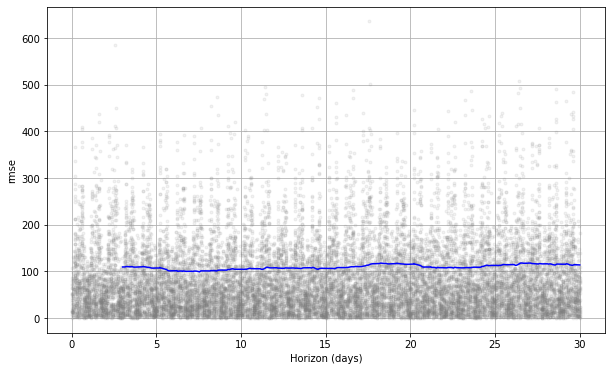

In [110]:
fig = plot_cross_validation_metric(df_cv, metric='rmse')

In [111]:
print('El RMSE es:', df_perform.rmse.mean())

El RMSE es: 109.176527108851


In [112]:
df_p = performance_metrics(df_cv, rolling_window = 1)

In [113]:
df_p

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,30 days,11966.184912,109.390059,80.668148,2.451315,0.433507,0.643347,0.705917


### Corremos modelo con mas variables

Entrenamiento. Quitamos columnas que no vamos a utilizar

In [114]:
# Genero dataframe de entrenamiento y transformo columna fechas.
df_grupo = df_train.copy()
df_grupo = df_grupo.rename(columns= {'dteday' : 'ds', 'cnt' : 'y'})
df_grupo.head()

,ds,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,y
0,2011-01-01 00:00:00,1,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2011-01-01 01:00:00,2,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,2011-01-01 02:00:00,3,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,2011-01-01 03:00:00,4,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,2011-01-01 04:00:00,5,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [115]:
from prophet import Prophet

Creamos modelo y agregamos regresores

In [117]:
# Usamos algunois hiperparametros y seleccionamos mayores correlaciones
modelo2 = Prophet(daily_seasonality= True, weekly_seasonality= True, changepoint_prior_scale= 0.5, seasonality_prior_scale= 5)
#modelo2.add_country_holidays(country_name='US')
modelo2.add_regressor('casual')
modelo2.add_regressor('registered')
#modelo2.add_regressor('season')
#modelo2.add_regressor('holiday')
modelo2.add_regressor('hr')
#modelo2.add_regressor('weekday')
#modelo2.add_regressor('weathersit')
#modelo2.add_regressor('workingday')
modelo2.add_regressor('temp')
modelo2.add_regressor('atemp')
modelo2.add_regressor('hum')
#modelo2.add_regressor('windspeed')
modelo2.fit(df_grupo)

09:07:15 - cmdstanpy - INFO - Chain [1] start processing
09:07:50 - cmdstanpy - INFO - Chain [1] done processing


### Evaluamos el Modelo de varias variables

In [118]:
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric
from prophet.utilities import regressor_coefficients 

In [119]:
df_cv = cross_validation(modelo2, horizon = '30 days')

  0%|          | 0/26 [00:00<?, ?it/s]09:09:18 - cmdstanpy - INFO - Chain [1] start processing
09:09:22 - cmdstanpy - INFO - Chain [1] done processing
  4%|▍         | 1/26 [00:04<01:51,  4.47s/it]09:09:23 - cmdstanpy - INFO - Chain [1] start processing
09:09:26 - cmdstanpy - INFO - Chain [1] done processing
  8%|▊         | 2/26 [00:09<01:48,  4.52s/it]09:09:27 - cmdstanpy - INFO - Chain [1] start processing
09:09:32 - cmdstanpy - INFO - Chain [1] done processing
 12%|█▏        | 3/26 [00:14<01:49,  4.77s/it]09:09:32 - cmdstanpy - INFO - Chain [1] start processing
09:09:37 - cmdstanpy - INFO - Chain [1] done processing
 15%|█▌        | 4/26 [00:19<01:52,  5.14s/it]09:09:38 - cmdstanpy - INFO - Chain [1] start processing
09:09:44 - cmdstanpy - INFO - Chain [1] done processing
 19%|█▉        | 5/26 [00:26<01:58,  5.63s/it]09:09:44 - cmdstanpy - INFO - Chain [1] start processing
09:09:51 - cmdstanpy - INFO - Chain [1] done processing
 23%|██▎       | 6/26 [00:33<02:05,  6.27s/it]09:09:52

In [121]:
df_cv

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2011-04-11 04:00:00,0.998820,0.902902,1.090704,1,2011-04-11 03:00:00
1,2011-04-11 05:00:00,12.998891,12.903401,13.091104,13,2011-04-11 03:00:00
2,2011-04-11 06:00:00,60.998976,60.904345,61.089770,61,2011-04-11 03:00:00
3,2011-04-11 07:00:00,175.999153,175.905881,176.093475,176,2011-04-11 03:00:00
4,2011-04-11 08:00:00,313.999071,313.907618,314.086988,314,2011-04-11 03:00:00
...,...,...,...,...,...,...
18653,2012-05-19 23:00:00,239.001649,238.878826,239.134828,239,2012-04-20 03:00:00
18654,2012-05-20 00:00:00,170.001875,169.880244,170.127918,170,2012-04-20 03:00:00
18655,2012-05-20 01:00:00,129.999645,129.886177,130.127575,130,2012-04-20 03:00:00
18656,2012-05-20 02:00:00,97.999412,97.882887,98.112578,98,2012-04-20 03:00:00


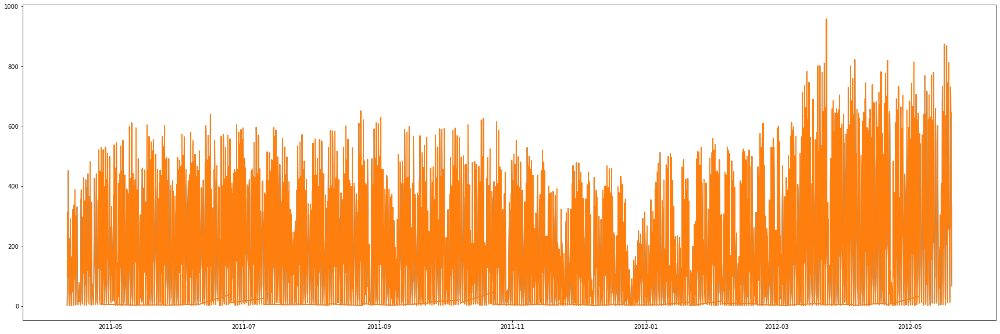

In [122]:
fig, ax = plt.subplots(figsize = (30, 10))
plt.plot(df_cv['ds'], df_cv.y, label= 'y')
plt.plot(df_cv['ds'], df_cv.yhat, label= 'yhat')


In [123]:
df_perform = performance_metrics(df_cv)
df_perform.describe()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
count,649,649.000000,649.000000,649.000000,649.000000,649.000000,649.000000,649.0
mean,16 days 12:00:00,0.000060,0.007544,0.005173,0.000218,0.000030,0.000218,1.0
std,7 days 19:29:39.999703695,0.000025,0.001675,0.001121,0.000050,0.000006,0.000050,0.0
min,3 days 00:00:00,0.000018,0.004280,0.003081,0.000129,0.000019,0.000129,1.0
25%,9 days 18:00:00,0.000037,0.006044,0.004225,0.000178,0.000023,0.000178,1.0
50%,16 days 12:00:00,0.000061,0.007796,0.005479,0.000223,0.000031,0.000223,1.0
75%,23 days 06:00:00,0.000085,0.009211,0.006285,0.000254,0.000035,0.000255,1.0
max,30 days 00:00:00,0.000111,0.010543,0.007147,0.000341,0.000040,0.000342,1.0


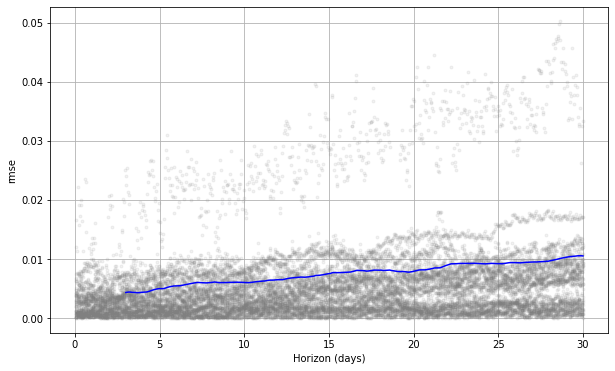

In [124]:
fig = plot_cross_validation_metric(df_cv, metric='rmse')

In [125]:
print('El RMSE es:', df_perform.rmse.mean())

El RMSE es: 0.0075439383403265925


In [126]:
df_p = performance_metrics(df_cv, rolling_window = 1)

In [127]:
df_p

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,30 days,0.00006,0.007764,0.005173,0.00022,0.000029,0.00022,1.0


In [129]:
from prophet.utilities import regressor_coefficients 

In [128]:
regressor_coefficients(modelo2)

,regressor,regressor_mode,center,coef_lower,coef,coef_upper
0,casual,additive,30.049837,1.000037,1.000037,1.000037
1,registered,additive,128.545129,0.999997,0.999997,0.999997
2,hr,additive,11.556630,0.000419,0.000419,0.000419
3,temp,additive,0.465704,-0.129919,-0.129919,-0.129919
4,atemp,additive,0.448888,0.053476,0.053476,0.053476
5,hum,additive,0.625770,0.001205,0.001205,0.001205


Preparamos dataframe para prediccion y reralizamos prediccion

Predicción con datos reales y datos nuevos

In [130]:
#df_test_grupo = df_test[['dteday', 'season', 'holiday', 'weekday', 'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed']].copy()
df_test_grupo = df_test[['dteday', 'hr', 'temp', 'atemp', 'hum']].copy()
df_test_grupo = df_test_grupo.rename(columns= {'dteday' : 'ds'})

¡No tenemos los datos de casual y registred por lo cual vamos a tener que predecirlas!

In [131]:
#Convierto fechas a indices para cargar datos de testeo
df_grupo = df_grupo.set_index('ds')
df_test_grupo = df_test_grupo.set_index('ds')

In [297]:
# Funciones para completar datos futuros
def estacion(ds):
    date = (pd.to_datetime(ds)).date()
    
    if df_grupo[date:].empty:
            return df_test_grupo[date:]['season'].values[0]
    else:
            return (df_grupo[date:]['season']).values[0]
    
    return 0


def hora(ds):
    date = (pd.to_datetime(ds)).date()
    
    
    if df_grupo[date:].empty:
            
            return df_test_grupo[date:]['hr'].values[0]
    else:
            return df_grupo[date:]['hr'].values[0]
    
    return 0

def clima(ds):
    date = (pd.to_datetime(ds)).date()
    
    if df_grupo[date:].empty:
        return df_test_grupo[date:]['weathersit'].values[0]
    else:
        return (df_grupo[date:]['weathersit']).values[0]
    
    return 0

def temp(ds):
    date = (pd.to_datetime(ds)).date()
    
    if df_grupo[date:].empty:
        return df_test_grupo[date:]['temp'].values[0]
    else:
        return (df_grupo[date:]['temp']).values[0]
    
    return 0

def sen_tem(ds):
    date = (pd.to_datetime(ds)).date()
    
    if df_grupo[date:].empty:
        return df_test_grupo[date:]['atemp'].values[0]
    else:
        return (df_grupo[date:]['atemp']).values[0]
    
    return 0

def vacaciones(ds):
    date = (pd.to_datetime(ds)).date()
    
    if df_grupo[date:].empty:
        return df_test_grupo[date:]['holiday'].values[0]
    else:
        return (df_grupo[date:]['holiday']).values[0]
    
    return 0

def dia_semana(ds):
    date = (pd.to_datetime(ds)).date()
    
    if df_grupo[date:].empty:
        return df_test_grupo[date:]['weekday'].values[0]
    else:
        return (df_grupo[date:]['weekday']).values[0]
    
    return 0

def feriado(ds):
    date = (pd.to_datetime(ds)).date()
    
    if df_grupo[date:].empty:
        return df_test_grupo[date:]['workingday'].values[0]
    else:
        return (df_grupo[date:]['workingday']).values[0]
    
    return 0

def humedad(ds):
    date = (pd.to_datetime(ds)).date()
    
    if df_grupo[date:].empty:
        return df_test_grupo[date:]['hum'].values[0]
    else:
        return (df_grupo[date:]['hum']).values[0]
    
    return 0

def viento(ds):
    date = (pd.to_datetime(ds)).date()
    
    if df_grupo[date:].empty:
        return df_test_grupo[date:]['windspeed'].values[0]
    else:
        return (df_grupo[date:]['windspeed']).values[0]
    
    return 0



In [289]:
# Creacion de Dataframe a predecir
future_grupo = modelo2.make_future_dataframe(periods= len(df_test_grupo), freq= 'H', include_history= True)

In [298]:
# Agregamos y completamos columnas
#future_grupo['season'] = future_grupo['ds'].apply(estacion)
#future_grupo['holiday'] = future_grupo['ds'].apply(vacaciones)

#future_grupo['weekday'] = future_grupo['ds'].apply(dia_semana)
#future_grupo['workingday'] = future_grupo['ds'].apply(feriado)
#future_grupo['weathersit'] = future_grupo['ds'].apply(clima)
future_grupo['temp'] = future_grupo['ds'].apply(temp)
future_grupo['atemp'] = future_grupo['ds'].apply(sen_tem)
future_grupo['hum'] = future_grupo['ds'].apply(humedad)
#future_grupo['windspeed'] = future_grupo['ds'].apply(viento)
future_grupo['hr'] = future_grupo['ds'].apply(hora)

In [296]:
future_grupo

,ds,temp,atemp,hum,hr,horar
0,2011-01-01 00:00:00,0.24,0.2879,0.81,0,0
1,2011-01-01 01:00:00,0.24,0.2879,0.81,0,0
2,2011-01-01 02:00:00,0.24,0.2879,0.81,0,0
3,2011-01-01 03:00:00,0.24,0.2879,0.81,0,0
4,2011-01-01 04:00:00,0.24,0.2879,0.81,0,0
...,...,...,...,...,...,...
17374,2012-12-30 03:00:00,0.26,0.2576,0.60,0,0
17375,2012-12-30 04:00:00,0.26,0.2576,0.60,0,0
17376,2012-12-30 05:00:00,0.26,0.2576,0.60,0,0
17377,2012-12-30 06:00:00,0.26,0.2576,0.60,0,0


In [147]:
forecast2 = modelo2.predict(future_grupo)

ValueError: Regressor 'casual' missing from dataframe

In [289]:
plot_plotly(modelo2,forecast2)

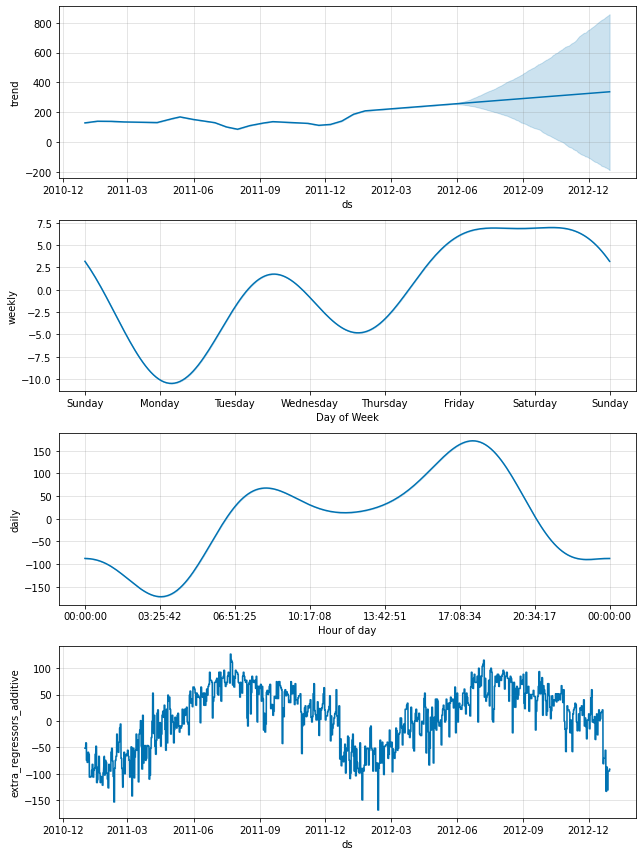

In [291]:
fig3 = modelo2.plot_components(forecast2)

In [258]:
len(forecast2.iloc[11999:])

5380

In [171]:
df_export = pd.DataFrame(forecast2.iloc[11999:]['yhat'])

df_export.rename(columns = {'yhat': 'pred'}, inplace= True)
#df_export.to_csv('vilarmauricio.csv', index= False)

Predicción solo datos nuevos.

In [299]:
df_test_grupo = df_test_grupo.rename(columns= {'dteday' : 'ds'})
df_test_grupo.reset_index(inplace = True)


In [300]:
forecast3 = modelo2.predict(df_test_grupo)

ValueError: Regressor 'casual' missing from dataframe

In [294]:
plot_plotly(modelo2,forecast3)

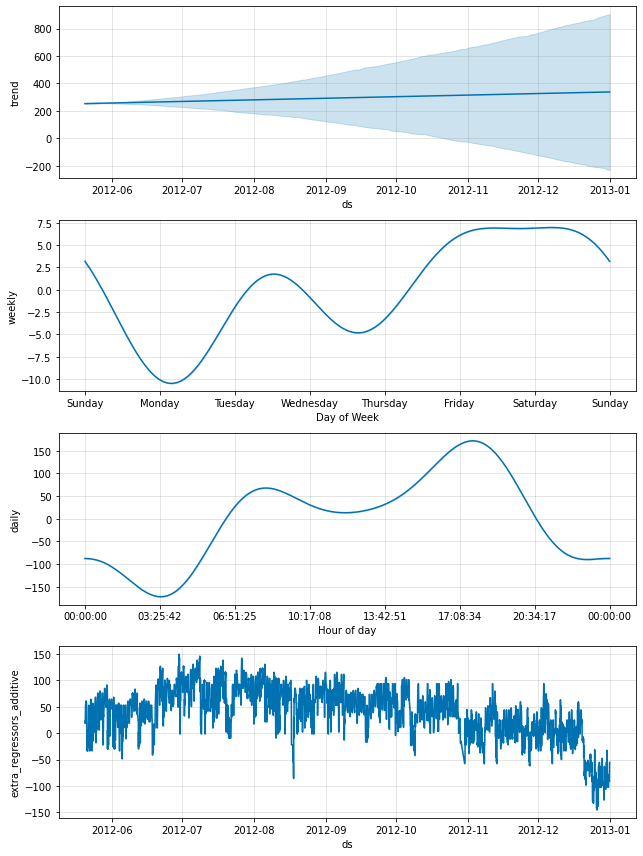

In [295]:
fig3 = modelo2.plot_components(forecast3)

Creamos archivo a exportar

In [296]:
df_export = pd.DataFrame(forecast3['yhat'])

df_export.rename(columns = {'yhat': 'pred'}, inplace= True)
#df_export.to_csv('vilarmauricio2.csv', index= False)

### Ajustes de hiperparametros

In [309]:
# Genero dataframe de entrenamiento y transformo columna fechas.
#df_grupo2 = df_train[['dteday', 'hr', 'mnth', 'cnt', 'season', 'holiday', 'weekday', 'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed']].copy()
df_grupo2 = df_train[['dteday', 'cnt', 'hr', 'mnth','weekday', 'season', 'holiday', 'weathersit', 'temp', 'atemp']].copy()
df_grupo2 = df_grupo2.rename(columns= {'dteday' : 'ds', 'cnt' : 'y'})
df_grupo2.head()

,ds,y,hr,mnth,weekday,season,holiday,weathersit,temp,atemp
0,2011-01-01 00:00:00,16,0,1,6,1,0,1,0.24,0.2879
1,2011-01-01 01:00:00,40,1,1,6,1,0,1,0.22,0.2727
2,2011-01-01 02:00:00,32,2,1,6,1,0,1,0.22,0.2727
3,2011-01-01 03:00:00,13,3,1,6,1,0,1,0.24,0.2879
4,2011-01-01 04:00:00,1,4,1,6,1,0,1,0.24,0.2879


In [328]:
# Python
import itertools
import numpy as np
import pandas as pd

# Parametros a variar
param_grid = {  
    'changepoint_prior_scale': [0.01, 0.05, 0.5],
    'seasonality_prior_scale': [10],
    'seasonality_mode' : ['multiplicative'],
    'daily_seasonality' : [True], 
    'weekly_seasonality' : [True], 
    'yearly_seasonality' : [False], 
    #'n_changepoints' : [240, 24, 2400],
    #'interval_width' : [0.95, 0.80],
    #'uncertainty_samples' : [50, 100],

}

# Generacion de combinacion de todos los parametros
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []  # Store the RMSEs for each params here

# Uso de cross validation para evaluar todos los parametros
for params in all_params:
    m = Prophet(**params) 
    m.add_regressor('season')
    m.add_regressor('holiday')
    m.add_regressor('hr')
    #m.add_regressor('mnth')
    #m.add_regressor('weekday') 
    m.add_regressor('weathersit')
    #m.add_regressor('workingday') Cero cambio
    m.add_regressor('temp') # Cero Cambio
    #m.add_regressor('atemp')
    #m.add_regressor('hum')
    #m.add_regressor('windspeed') Cero cambio
    m.fit(df_grupo2)
    df_cv = cross_validation(m, horizon='10 days', parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1)
    rmses.append(df_p['rmse'].values[0])

# Buscamos mejores parametros de rmse
tuning_results = pd.DataFrame(all_params)
tuning_results['rmse'] = rmses
print(tuning_results)


00:29:27 - cmdstanpy - INFO - Chain [1] start processing
00:29:30 - cmdstanpy - INFO - Chain [1] done processing
00:31:11 - cmdstanpy - INFO - Chain [1] start processing
00:31:17 - cmdstanpy - INFO - Chain [1] done processing
00:33:47 - cmdstanpy - INFO - Chain [1] start processing
00:33:56 - cmdstanpy - INFO - Chain [1] done processing


   changepoint_prior_scale  seasonality_prior_scale seasonality_mode  \
0                     0.01                       10   multiplicative   
1                     0.05                       10   multiplicative   
2                     0.50                       10   multiplicative   

   daily_seasonality  weekly_seasonality  yearly_seasonality       rmse  
0               True                True               False  90.874468  
1               True                True               False  90.183190  
2               True                True               False  90.886556  


In [329]:
# Python
best_params = all_params[np.argmin(rmses)]
print(best_params)

{'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 10, 'seasonality_mode': 'multiplicative', 'daily_seasonality': True, 'weekly_seasonality': True, 'yearly_seasonality': False}


### Corremos nuevamente el modelo con los hiperparametros modificados

Entrenamiento. Quitamos columnas que no vamos a utilizar

In [313]:
# Genero dataframe de entrenamiento y transformo columna fechas.
df_grupo3 = df_train.copy()
df_grupo3 = df_grupo.rename(columns= {'dteday' : 'ds', 'cnt' : 'y'})
df_grupo3.head()

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,y
ds,,,,,,,,,,,,,,,,
2011-01-01 00:00:00,1,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
2011-01-01 01:00:00,2,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2011-01-01 02:00:00,3,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
2011-01-01 03:00:00,4,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
2011-01-01 04:00:00,5,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [314]:
from prophet import Prophet

Creamos modelo y agregamos regresores

In [316]:
df_grupo3.reset_index(inplace= True)

In [317]:
modelo3 = Prophet(daily_seasonality= True, weekly_seasonality= True, changepoint_prior_scale= 0.05, seasonality_prior_scale= 2, seasonality_mode= 'multiplicative', yearly_seasonality= False)
#modelo3.add_country_holidays(country_name='US')
modelo3.add_regressor('season')
modelo3.add_regressor('holiday')
modelo3.add_regressor('hr')
#modelo3.add_regressor('weekday')
modelo3.add_regressor('weathersit')
#modelo3.add_regressor('workingday')
#modelo3.add_regressor('temp')
modelo3.add_regressor('atemp')
#modelo3.add_regressor('hum')
#modelo3.add_regressor('windspeed')
modelo3.fit(df_grupo3)

23:44:05 - cmdstanpy - INFO - Chain [1] start processing
23:44:11 - cmdstanpy - INFO - Chain [1] done processing


Preparamos dataframe para prediccion y reralizamos prediccion

Prediccón con datos nuevos

In [330]:
#df_test_grupo = df_test[['dteday', 'season', 'holiday', 'weekday', 'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed']].copy()
df_test_grupo2 = df_test[['dteday', 'season', 'holiday', 'hr', 'weathersit', 'atemp']].copy()
df_test_grupo2 = df_test_grupo2.rename(columns= {'dteday' : 'ds'})

In [331]:
forecast4 = modelo3.predict(df_test_grupo2)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,atemp,atemp_lower,atemp_upper,daily,...,weathersit,weathersit_lower,weathersit_upper,weekly,weekly_lower,weekly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
20,2012-05-21 00:00:00,273.087349,-139.968538,71.765408,273.087349,273.087349,0.085564,0.085564,0.085564,-0.487672,...,-0.336296,-0.336296,-0.336296,-0.065924,-0.065924,-0.065924,0.0,0.0,0.0,-29.919442
21,2012-05-21 01:00:00,273.130367,-105.841584,111.237313,273.130367,273.130367,0.085564,0.085564,0.085564,-0.407339,...,-0.336296,-0.336296,-0.336296,-0.067456,-0.067456,-0.067456,0.0,0.0,0.0,-1.195130
22,2012-05-21 02:00:00,273.173385,-154.806820,66.318378,273.173385,273.173385,0.072102,0.072102,0.072102,-0.582928,...,-0.336296,-0.336296,-0.336296,-0.068544,-0.068544,-0.068544,0.0,0.0,0.0,-45.929124
23,2012-05-21 03:00:00,273.216403,-158.277289,51.123685,273.216403,273.216403,0.072102,0.072102,0.072102,-0.848679,...,-0.121405,-0.121405,-0.121405,-0.069180,-0.069180,-0.069180,0.0,0.0,0.0,-52.798020
24,2012-05-21 04:00:00,273.259421,-235.133349,-18.508501,273.259421,273.259421,0.072102,0.072102,0.072102,-0.916040,...,-0.336296,-0.336296,-0.336296,-0.069361,-0.069361,-0.069361,0.0,0.0,0.0,-122.774029
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5356,2012-12-31 00:00:00,504.351701,-112.259768,102.662189,306.772962,683.516407,-0.236545,-0.236545,-0.236545,-0.487672,...,0.093485,0.093485,0.093485,-0.065924,-0.065924,-0.065924,0.0,0.0,0.0,-1.755620
5358,2012-12-31 02:00:00,504.437737,-139.831277,77.512321,306.890263,683.716580,-0.249918,-0.249918,-0.249918,-0.582928,...,0.093485,0.093485,0.093485,-0.068544,-0.068544,-0.068544,0.0,0.0,0.0,-31.257069
5359,2012-12-31 03:00:00,504.480755,-268.209802,-29.149912,306.948914,683.816666,-0.236545,-0.236545,-0.236545,-0.848679,...,0.093485,0.093485,0.093485,-0.069180,-0.069180,-0.069180,0.0,0.0,0.0,-145.591082
5360,2012-12-31 04:00:00,504.523773,-298.630217,-46.759750,307.007565,683.916752,-0.249918,-0.249918,-0.249918,-0.916040,...,0.093485,0.093485,0.093485,-0.069361,-0.069361,-0.069361,0.0,0.0,0.0,-173.115820


In [332]:
plot_plotly(modelo3,forecast4)

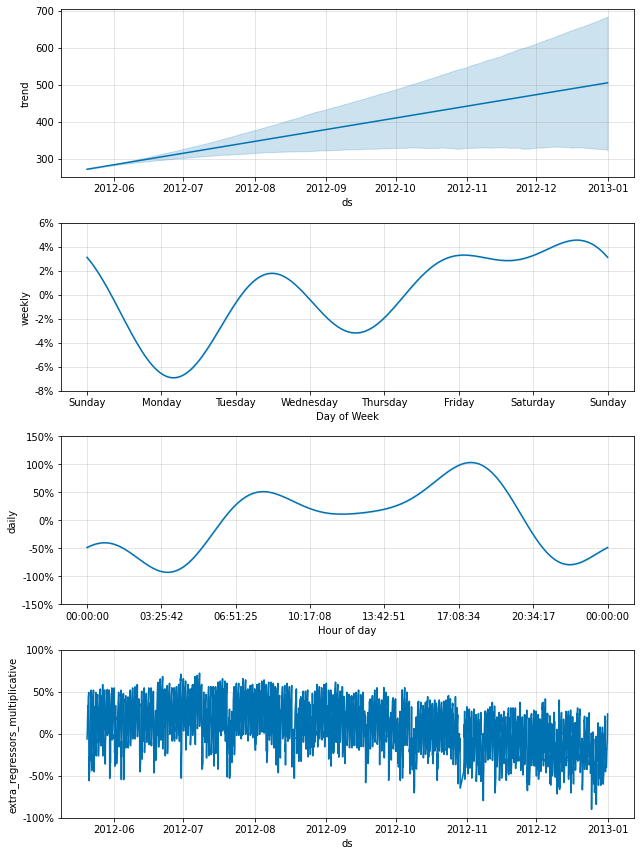

In [321]:
fig3 = modelo3.plot_components(forecast4)

Creamos archivo a exportar

In [ ]:
forecast4['yhat'] = forecast4['yhat'].apply(lambda x: 0 if x < 0 else x)

In [346]:

df_export = pd.DataFrame(forecast4['yhat'])

df_export.rename(columns = {'yhat': 'pred'}, inplace= True)
#df_export.to_csv('vilarmauricio.csv', index= False)